# Прогнозирование температуры звезды

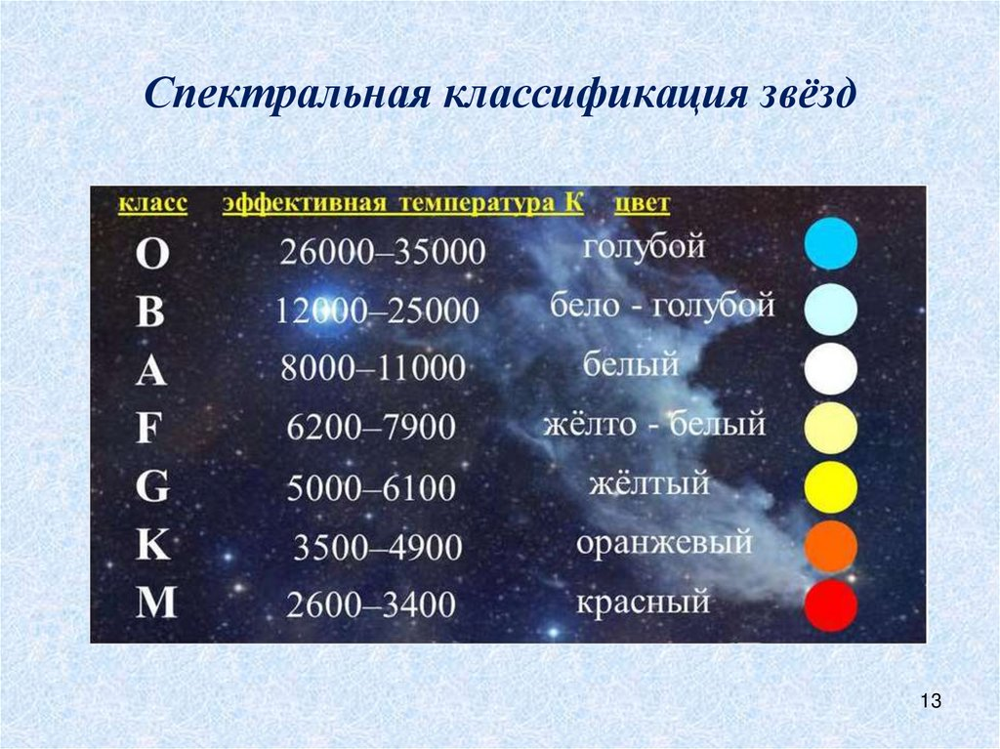

## Импорт необходимых библиотек

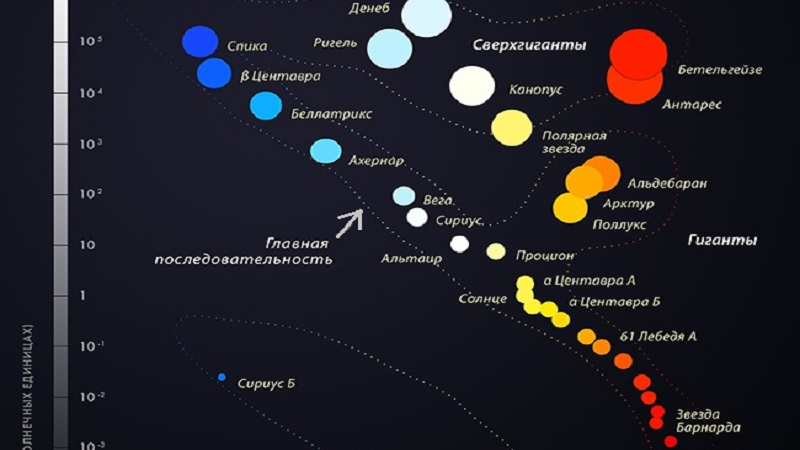

In [1]:
!pip install colorama

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import numpy as np 
import random

from math import ceil, sqrt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.compose import ColumnTransformer

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from colorama import Fore, Style

pd.options.mode.chained_assignment = None
torch.use_deterministic_algorithms(True)

In [3]:
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)

## Загрузка данных

In [4]:
df = pd.read_csv('/datasets/6_class.csv', index_col=0)

In [5]:
df.head()

,Temperature (K),Luminosity(L/Lo),Radius(R/Ro),Absolute magnitude(Mv),Star type,Star color
0,3068,0.002400,0.1700,16.12,0,Red
1,3042,0.000500,0.1542,16.60,0,Red
2,2600,0.000300,0.1020,18.70,0,Red
3,2800,0.000200,0.1600,16.65,0,Red
4,1939,0.000138,0.1030,20.06,0,Red


In [6]:
df.columns

Index(['Temperature (K)', 'Luminosity(L/Lo)', 'Radius(R/Ro)',
       'Absolute magnitude(Mv)', 'Star type', 'Star color'],
      dtype='object')

In [7]:
num_cols = ['Luminosity(L/Lo)','Radius(R/Ro)','Absolute magnitude(Mv)'] #числовые признаки
cat_cols = ['Star type', 'Star color'] #категориальные признаки
target = ['Temperature (K)'] #целевой признак

Исследуем значения в категориальных столбцах

In [8]:
df['Star color'].unique() 

array(['Red', 'Blue White', 'White', 'Yellowish White', 'Blue white',
       'Pale yellow orange', 'Blue', 'Blue-white', 'Whitish',
       'yellow-white', 'Orange', 'White-Yellow', 'white', 'Blue ',
       'yellowish', 'Yellowish', 'Orange-Red', 'Blue white ',
       'Blue-White'], dtype=object)

С этими данными нужно будет поработать чтобы привести к нужному виду.

In [9]:
df['Star type'].unique()

array([0, 1, 2, 3, 4, 5])

In [10]:
df.describe(include = 'all')

,Temperature (K),Luminosity(L/Lo),Radius(R/Ro),Absolute magnitude(Mv),Star type,Star color
count,240.000000,240.000000,240.000000,240.000000,240.000000,240
unique,NaN,NaN,NaN,NaN,NaN,19
top,NaN,NaN,NaN,NaN,NaN,Red
freq,NaN,NaN,NaN,NaN,NaN,112
mean,10497.462500,107188.361635,237.157781,4.382396,2.500000,NaN
std,9552.425037,179432.244940,517.155763,10.532512,1.711394,NaN
min,1939.000000,0.000080,0.008400,-11.920000,0.000000,NaN
25%,3344.250000,0.000865,0.102750,-6.232500,1.000000,NaN
50%,5776.000000,0.070500,0.762500,8.313000,2.500000,NaN
75%,15055.500000,198050.000000,42.750000,13.697500,4.000000,NaN


**Вывод**
`Temperature (K)` простирается от 2_000 градусов (красные звёзды) до 40_000 градусов (голубые звезды)    
`Luminosity(L/Lo)` в относительной светимости std достигает 179432 при среднем значении 107188
Так же в данных характеристиках очень большой разброс значений 

В `Star Color` 19 значений уникальных значений. В будущей их обработаем. 

## Предобработка и анализ данных

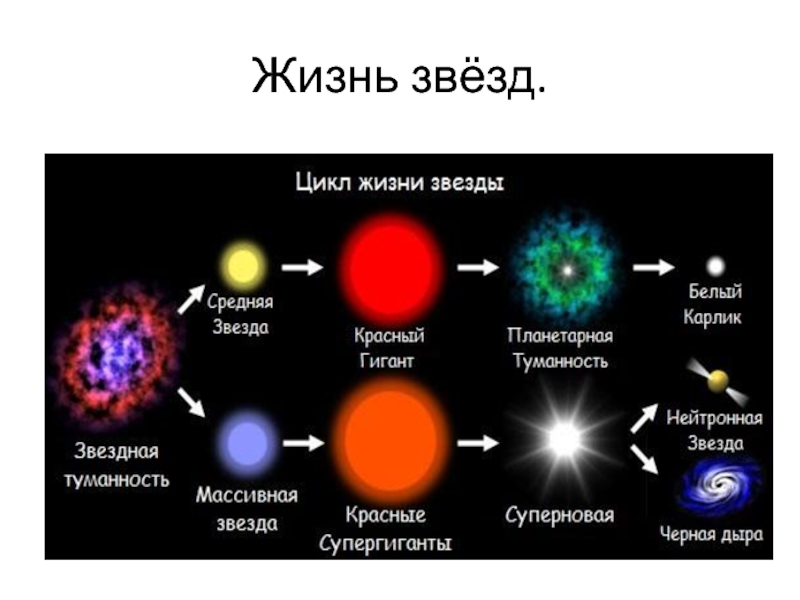

`Temperature (K)` — температура на поверхности звезды в Кельвинах.

`Luminosity(L/Lo)` — светимость звезды относительно Солнца.

`Radius(R/Ro)` — радиус звезды относительно радиуса Солнца.

`Absolute magnitude(Mv)` — физическая величина, характеризующая блеск звезды.

`Star type` — Тип звезды:

- 0 — Коричневый карлик.
- 1 — Красный карлик.
- 2 — Белый карлик.
- 3 — Звёзды главной последовательности.
- 4 — Сверхгигант.
- 5 — Гипергигант.

`Star color` — цвет звезды, который определяют на основе спектрального анализа.




In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 240 entries, 0 to 239
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Temperature (K)         240 non-null    int64  
 1   Luminosity(L/Lo)        240 non-null    float64
 2   Radius(R/Ro)            240 non-null    float64
 3   Absolute magnitude(Mv)  240 non-null    float64
 4   Star type               240 non-null    int64  
 5   Star color              240 non-null    object 
dtypes: float64(3), int64(2), object(1)
memory usage: 13.1+ KB


In [12]:
df.isna().sum().to_frame()

,0
Temperature (K),0
Luminosity(L/Lo),0
Radius(R/Ro),0
Absolute magnitude(Mv),0
Star type,0
Star color,0


Пропусков нет

In [13]:
df.duplicated().sum()

0

Дубликатов нет

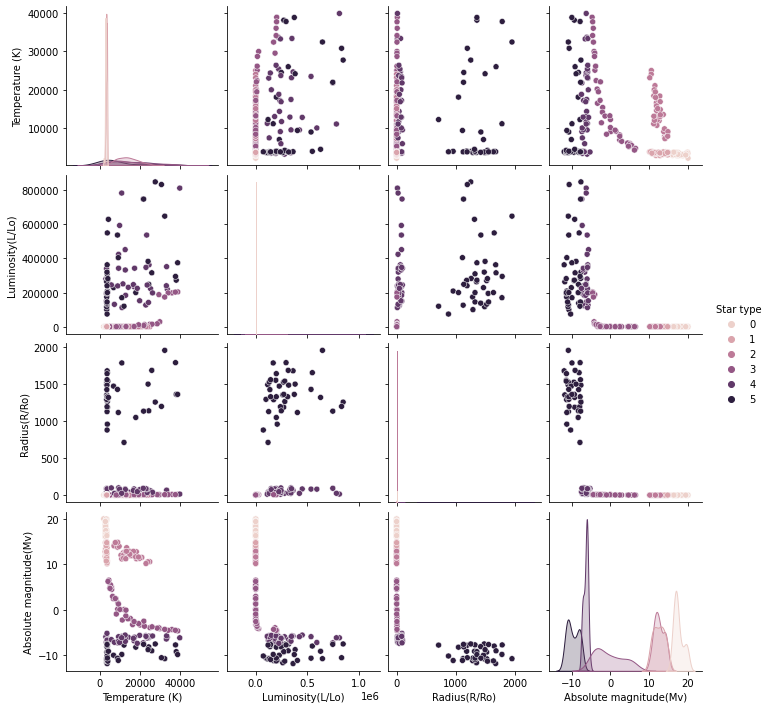

In [14]:
sns.pairplot(df, hue='Star type');

С увеличением температуры начинает уменьшаться абсолютная звёздная величина

При помощи радиуса можно выделить тип звезды

Хорошо выделяются кластеры типа звезды в зависимости абсолютной звёздой величины

In [15]:
def data_spread(column_list, df):
    '''Разброс данных. Отображение диаграммы размаха и гистограммы. Входные данные list колонок и df'''
    for column in column_list:
        df.boxplot(column=column)
        plt.title(f'Диаграмма размаха на столбце {column}')
        plt.show()
        df[column].hist(bins=100,ec='black', figsize=(16,8))
        plt.title(f'Гистограмма на столбце {column}')
        plt.xlabel(column)
        plt.ylabel('Кол-во наблюдений')
        plt.show()
        print('--------------------------------------------')

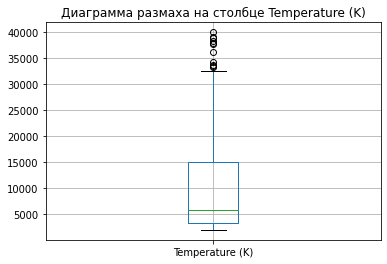

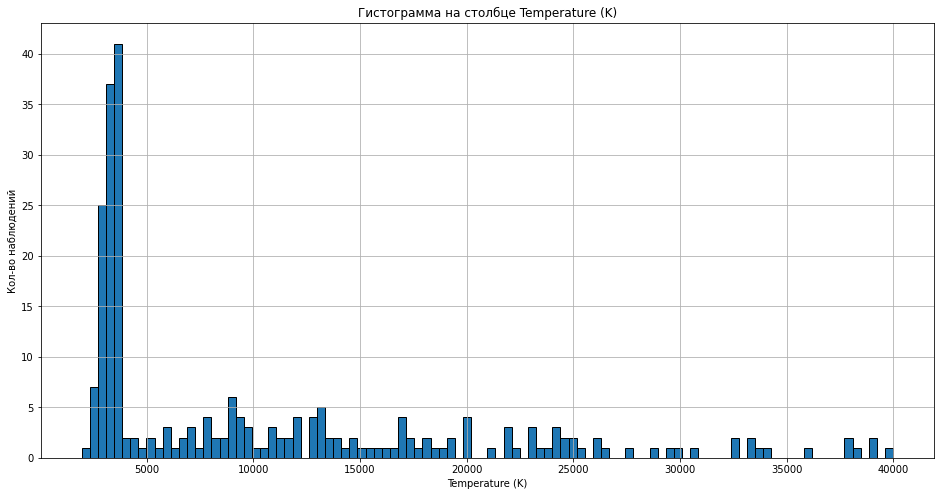

--------------------------------------------


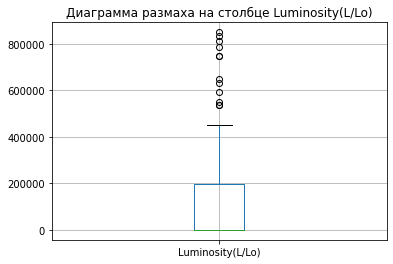

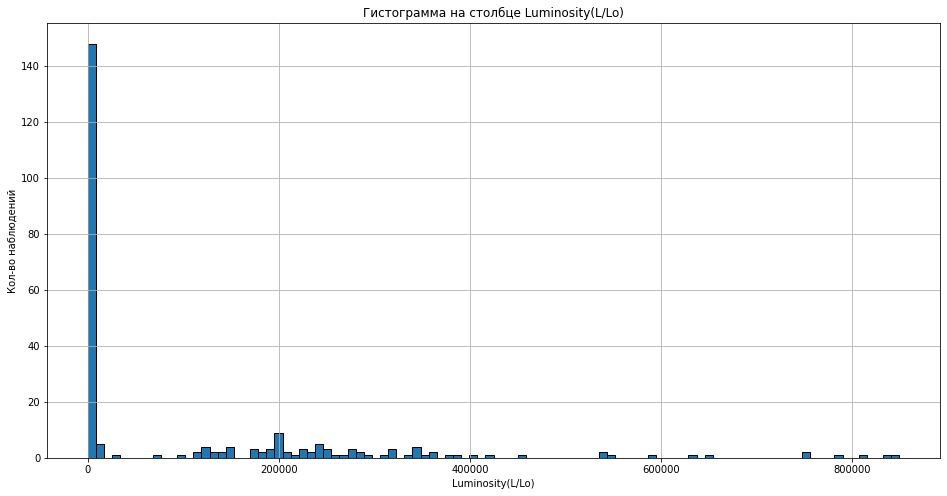

--------------------------------------------


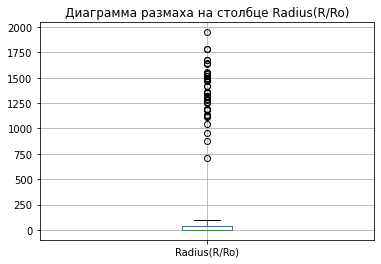

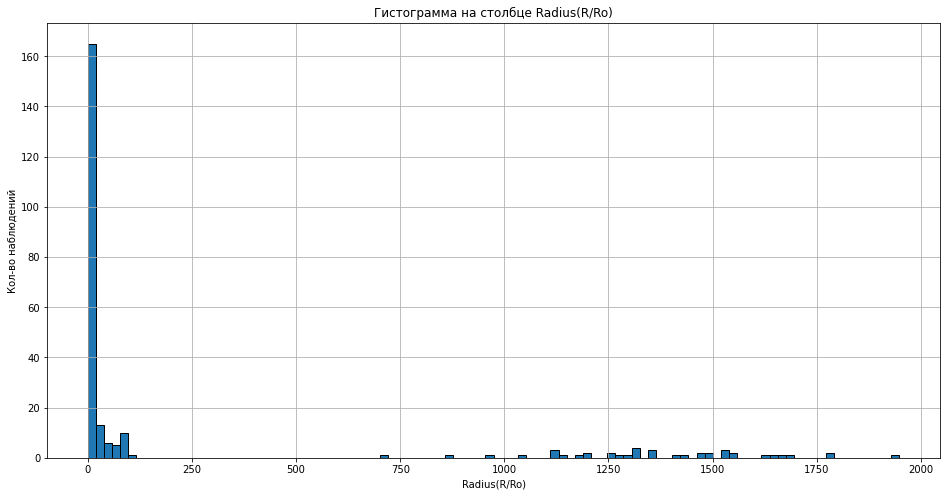

--------------------------------------------


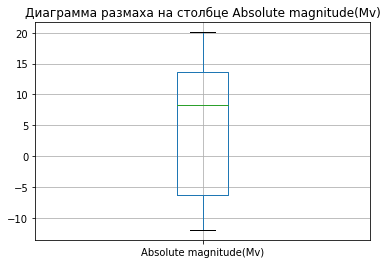

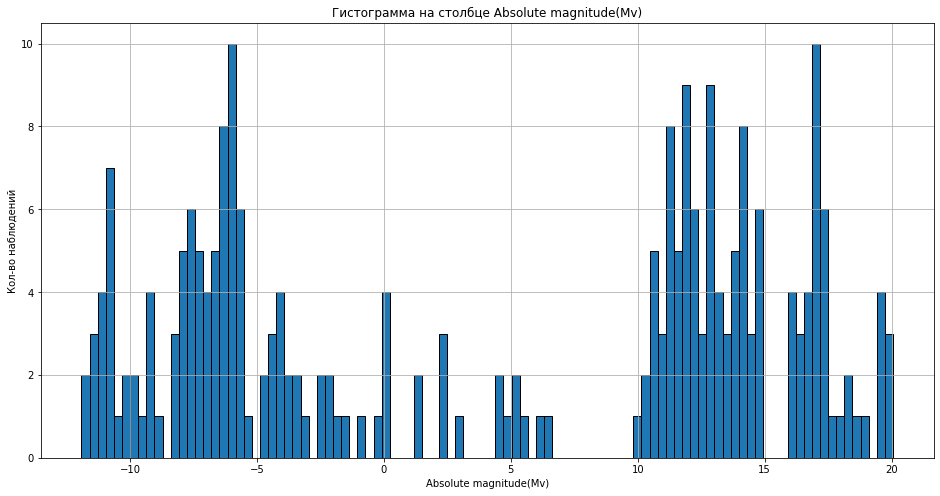

--------------------------------------------


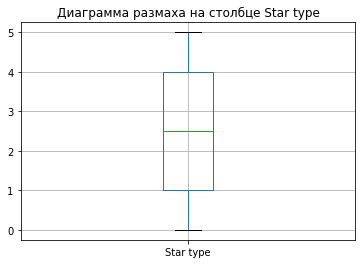

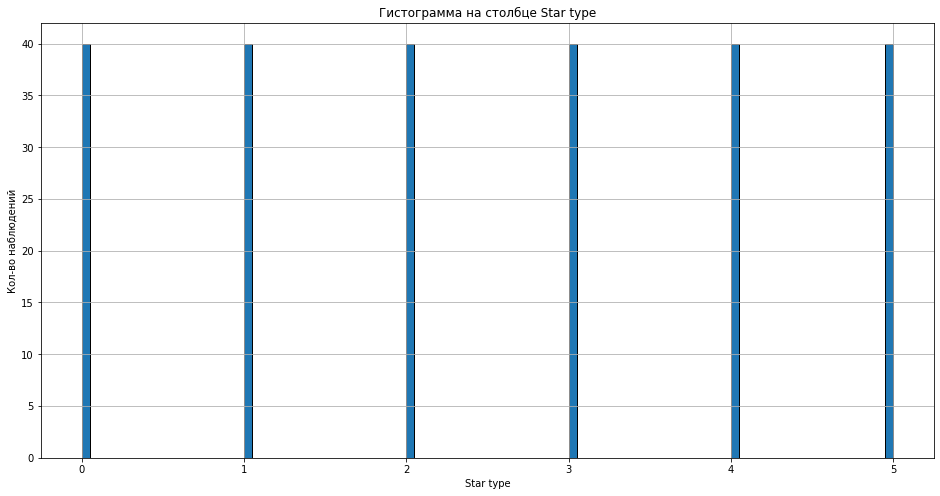

--------------------------------------------


In [16]:
data_spread(['Temperature (K)', 'Luminosity(L/Lo)', 'Radius(R/Ro)', 'Absolute magnitude(Mv)', 'Star type'], df)

In [17]:
df.describe()

,Temperature (K),Luminosity(L/Lo),Radius(R/Ro),Absolute magnitude(Mv),Star type
count,240.000000,240.000000,240.000000,240.000000,240.000000
mean,10497.462500,107188.361635,237.157781,4.382396,2.500000
std,9552.425037,179432.244940,517.155763,10.532512,1.711394
min,1939.000000,0.000080,0.008400,-11.920000,0.000000
25%,3344.250000,0.000865,0.102750,-6.232500,1.000000
50%,5776.000000,0.070500,0.762500,8.313000,2.500000
75%,15055.500000,198050.000000,42.750000,13.697500,4.000000
max,40000.000000,849420.000000,1948.500000,20.060000,5.000000


Займемся категориальными данными, для начала изменим цвет звезд в единый вид

In [18]:
df['Star color'].value_counts()

Red                   112
Blue                   55
Blue-white             26
Blue White             10
yellow-white            8
White                   7
Blue white              3
white                   3
Yellowish White         3
yellowish               2
Whitish                 2
Orange                  2
Blue                    1
Blue white              1
Blue-White              1
Pale yellow orange      1
Orange-Red              1
White-Yellow            1
Yellowish               1
Name: Star color, dtype: int64

1) Можем увидеть, что есть опечатки в названиях. Например `Blue-white` и `Blue White`    
2) Некоторых классы существуют в единичном экземпляре.    
3) Так же погуглив у нас в классификации цвета звёзд существуют неизвестные классы для науки.   

Можно предположить, что в данных целевая характеристика определена правильно и при помощи маленькой функции можно перезаписать цвет звезды в зависимости от температуры 

In [20]:
colors = {'Blue White': 'Blue_white', 
             'Blue white': 'Blue_white', 
             'Blue-white': 'Blue_white',
             'Blue white ': 'Blue_white', 
             'Blue-White': 'Blue_white', 
             'Red':'Red', 
             'White':'White',
             'white':'White', 
             'Blue':'Blue', 
             'Blue ' :'Blue', 
             'Yellowish White': 'Yellowish_White',
             'yellow-white': 'Yellowish_White', 
             'White-Yellow': 'White_Yellow',
             'yellowish' : 'Yellowish', 
             'Yellowish': 'Yellowish',
             'Orange':'Orange', 
             'Whitish' : 'Whitish', 
             'Orange-Red' : 'Orange_Red',
             'Pale yellow orange' :'Pale_yellow_orange'
            }

In [21]:
for key,value in colors.items():
    df.loc[df['Star color'] == key, 'Star color'] = value

In [22]:
df['Star color'].value_counts()

Red                   112
Blue                   56
Blue_white             41
Yellowish_White        11
White                  10
Yellowish               3
Orange                  2
Whitish                 2
White_Yellow            1
Pale_yellow_orange      1
Orange_Red              1
Name: Star color, dtype: int64

In [23]:
df = df.loc[df['Star color'].isin(['Red','Blue','Blue_white','Yellowish_White','White'])]

In [24]:
df['Star color'].value_counts()

Red                112
Blue                56
Blue_white          41
Yellowish_White     11
White               10
Name: Star color, dtype: int64

In [25]:
df.head()

,Temperature (K),Luminosity(L/Lo),Radius(R/Ro),Absolute magnitude(Mv),Star type,Star color
0,3068,0.002400,0.1700,16.12,0,Red
1,3042,0.000500,0.1542,16.60,0,Red
2,2600,0.000300,0.1020,18.70,0,Red
3,2800,0.000200,0.1600,16.65,0,Red
4,1939,0.000138,0.1030,20.06,0,Red


In [26]:
df['Star type'] = df['Star type'].astype(dtype='object')

In [27]:
df.shape

(230, 6)

In [28]:
print('Потеря данных: ', 100 - (230 * 100/ 240), '%')

Потеря данных:  4.166666666666671 %


## Подготовка данных к построению модели

In [29]:
# Разделим нашу выборку
X_train, X_test, y_train, y_test = train_test_split(df.drop('Temperature (K)', axis = 1),
                                                    df['Temperature (K)'],
                                                    test_size=0.2,
                                                    shuffle=True,
                                                    random_state=1)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(184, 5) (46, 5) (184,) (46,)


In [30]:
# Поставим ограничений на число столбцов
pd.set_option('display.max_rows', 10)

In [31]:
numerics = ['Luminosity(L/Lo)','Radius(R/Ro)','Absolute magnitude(Mv)']
categorical = ['Star color', 'Star type']

col_transformer = ColumnTransformer(
                        transformers=[
                            ('scaler', StandardScaler(), numerics),
                            ('ohe', OneHotEncoder(sparse=False), categorical)],
                                remainder="passthrough"
                                  )

col_transformer.fit(X_train)
X_train = col_transformer.transform(X_train)
X_test = col_transformer.transform(X_test)

In [32]:
pd.DataFrame(X_train).head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.983482,2.100516,-1.544499,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.075407,-0.445748,-0.998656,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,-0.598132,-0.468581,0.730469,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
3,-0.598132,-0.468297,0.936095,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,-0.598132,-0.468431,1.115550,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


## Построение базовой нейронной сети

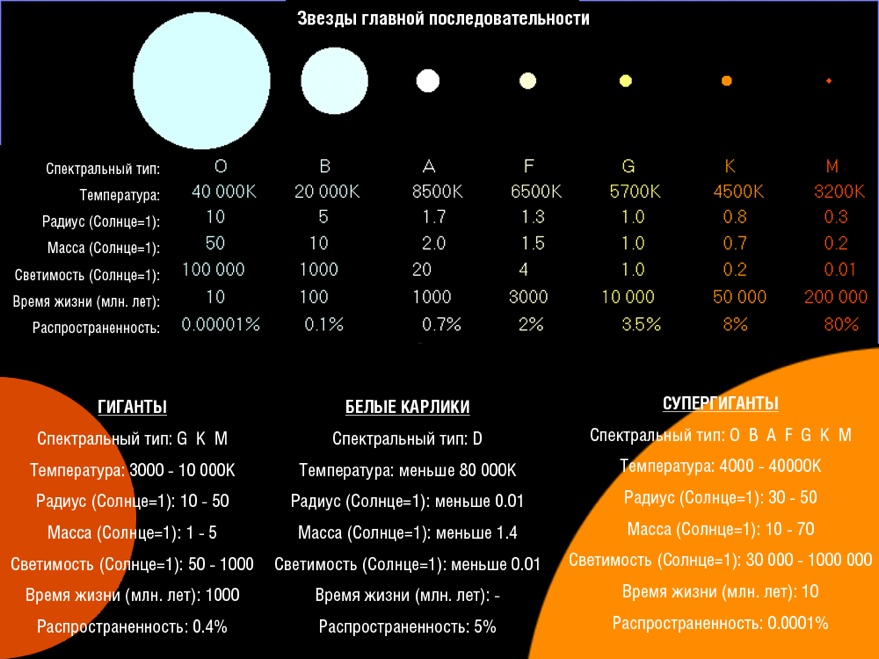| 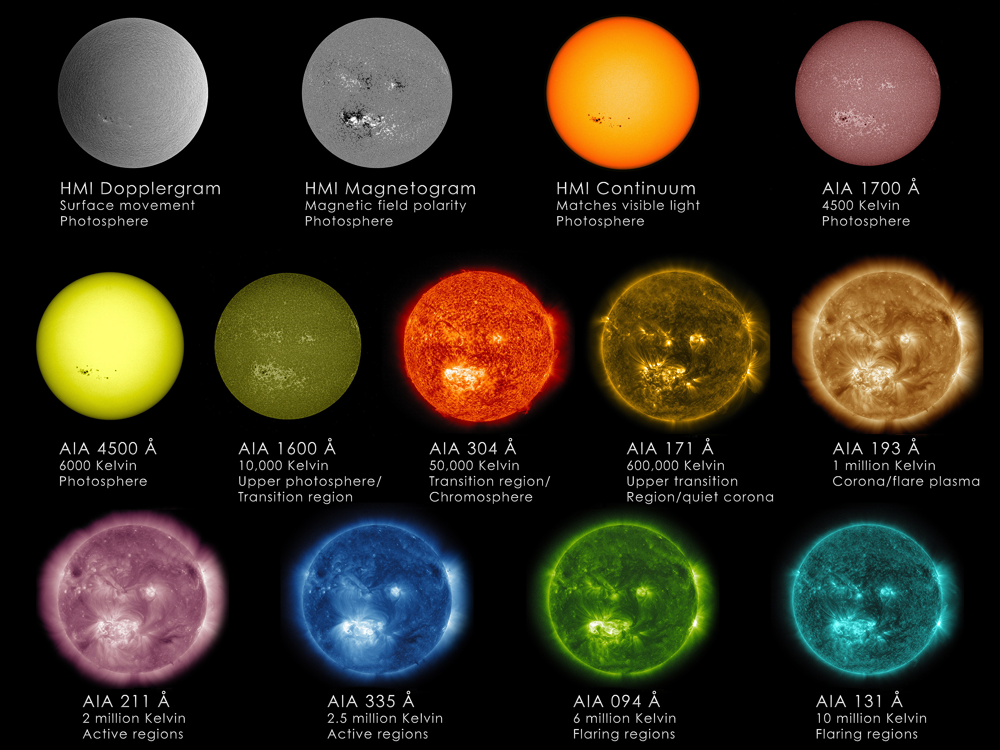

In [33]:
# Переведём выборки в тензоры
X_train = torch.FloatTensor(np.array(X_train))
X_test = torch.FloatTensor(np.array(X_test))
y_train = torch.FloatTensor(np.array(y_train))
y_test = torch.FloatTensor(np.array(y_test))

In [34]:
# Создадим ПНС
class Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons):
            super(Net, self).__init__()
            
            self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
            self.act1 = nn.ReLU()
            self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
            self.act2 = nn.ReLU()
            self.fc3 = nn.Linear(n_hidden_neurons_2, n_out_neurons)
            
    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.fc3(x)
        
        return x

In [35]:
n_in_neurons = X_train.shape[1]
n_hidden_neurons_1 = 15
n_hidden_neurons_2 = 10
n_out_neurons = 1

net = Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons)
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3)
loss = nn.MSELoss()

In [36]:
dataset_train = torch.utils.data.TensorDataset(X_train, y_train)
dataset_test = torch.utils.data.TensorDataset(X_test, y_test)

train_dataloader = DataLoader(dataset_train, batch_size=40, shuffle=True,
                              num_workers=0)
test_dataloader = DataLoader(dataset_test, batch_size=40, num_workers=0)    

In [37]:
class CustomEarlyStopping():
    """
    Ранняя остановка, чтобы остановить тренировку, когда потеря не улучшается после определенной эпохи.
    """
    def __init__(self, patience=5, min_delta=0):
        """
        :param patience: сколько эпох ждать, прежде чем остановиться, когда потеря не улучшается
        :param min_delta: минимальная разница между loss/метриками, если улучшений нет, то остановим обучение
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss == None:
            self.best_loss = val_loss
        elif self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            # reset counter if validation loss improves
            self.counter = 0
        elif self.best_loss - val_loss < self.min_delta:
            self.counter += 1
            print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
            if self.counter >= self.patience:
                print('INFO: Early stopping')
                self.early_stop = True

In [38]:
# Обучим нейросеть
early_stopping = CustomEarlyStopping(patience=5, min_delta=20)

num_epochs = 100001
for epoch in range(num_epochs):
    net.train()
    for batch in train_dataloader:
        data_train, temperature_train = batch # просто выгружаем данные 
        optimizer.zero_grad()

        preds = net.forward(data_train).flatten()

        loss_value = torch.sqrt(loss(preds, temperature_train))
        loss_value.backward()
        optimizer.step()
    
    if epoch % 200 == 0:
        predicted_temp = [] 
        with torch.no_grad():
            net.eval()
            for batch in test_dataloader:
                data_test, temperature_test = batch # просто выгружаем данные

                test_preds = net.forward(data_test).flatten()
                predicted_temp.append(test_preds)
                RMSE_loss = torch.sqrt(loss(test_preds, temperature_test))

        predicted_temp = torch.cat(predicted_temp).detach().numpy()
        RMSE = mean_squared_error(y_test, predicted_temp, squared=False)
        early_stopping(RMSE)
        if early_stopping.counter == 0:
            best_rmse = RMSE
            best_predicted_temp = predicted_temp
        print(f"epoch:{epoch}, RMSE test: {RMSE}")

        if early_stopping.early_stop:
            print('Early Stoppning!!!')
            print(f'Best RMSE test {best_rmse}')
            break 

epoch:0, RMSE test: 15774.5537109375
epoch:200, RMSE test: 14791.9765625
epoch:400, RMSE test: 10411.896484375
epoch:600, RMSE test: 7896.45703125
epoch:800, RMSE test: 7190.18701171875
epoch:1000, RMSE test: 6737.33349609375
epoch:1200, RMSE test: 6384.89453125
epoch:1400, RMSE test: 6120.5615234375
epoch:1600, RMSE test: 5944.96630859375
epoch:1800, RMSE test: 5805.3525390625
epoch:2000, RMSE test: 5725.04736328125
epoch:2200, RMSE test: 5654.38525390625
epoch:2400, RMSE test: 5592.65869140625
epoch:2600, RMSE test: 5544.6259765625
epoch:2800, RMSE test: 5496.763671875
epoch:3000, RMSE test: 5437.25830078125
epoch:3200, RMSE test: 5416.93017578125
epoch:3400, RMSE test: 5391.00439453125
INFO: Early stopping counter 1 of 5
epoch:3600, RMSE test: 5374.638671875
epoch:3800, RMSE test: 5350.83447265625
epoch:4000, RMSE test: 5322.70703125
INFO: Early stopping counter 1 of 5
epoch:4200, RMSE test: 5329.216796875
INFO: Early stopping counter 2 of 5
epoch:4400, RMSE test: 5328.25439453125
I

In [39]:
def fact_forecast(test_preds, y_test):
    
    '''Функция для визуализации качества регрессии "Факт-прогноз"'''
    
    y1 = torch.FloatTensor(test_preds)
    y1 = y1.detach().numpy().reshape([-1])
    y2 = y_test.detach().numpy().reshape([-1])
    x = np.arange(len(y1))

    fig,ax = plt.subplots()
    fig.set_figwidth(18)
    fig.set_figheight(8)
    ax.set_xticks(x)
    fact = ax.bar(x, y2, width = 0.6, label = 'Факт')
    forecast = ax.bar(x, y1, width = 0.3, label = 'Прогноз')
    ax.legend()
    ax.set_title('График "Факт-прогноз"', fontsize=20)
    ax.set_xlabel('Номер звезды')
    ax.set_ylabel('Температура звезды')
    plt.show()

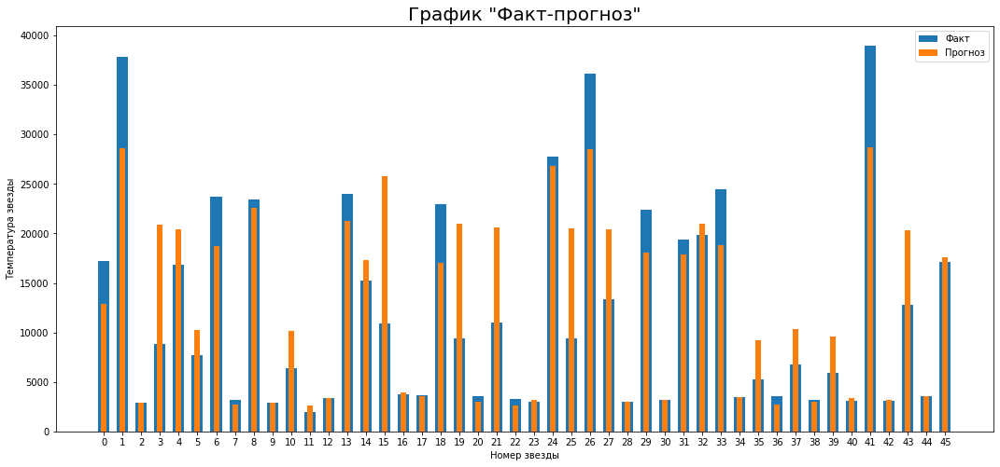

In [40]:
# Визуализируем полученные значения
fact_forecast(predicted_temp, y_test)

Нам удалось обучить baseline без дополнительных введений и перебора параметров. Лучшая метрика RMSE до начала переобучения равна 3124. Однако, это не лучший результат, которого мы можем добиться, далее будем улучшаять нашу НС. Судя по графику факт-прогноз мы отлично угадываем температуру звёзд с минимальным отклонением до 5000 градусов по Кельвину. Далее алгоритм начинает брать то выше правильного ответа, то ниже, скорее всего это связано с небольшим количеством подобных звёзд в нашей выборке, НС просто не смогла правильно научиться на таком малом количестве данных.

## Улучшение нейронной сети

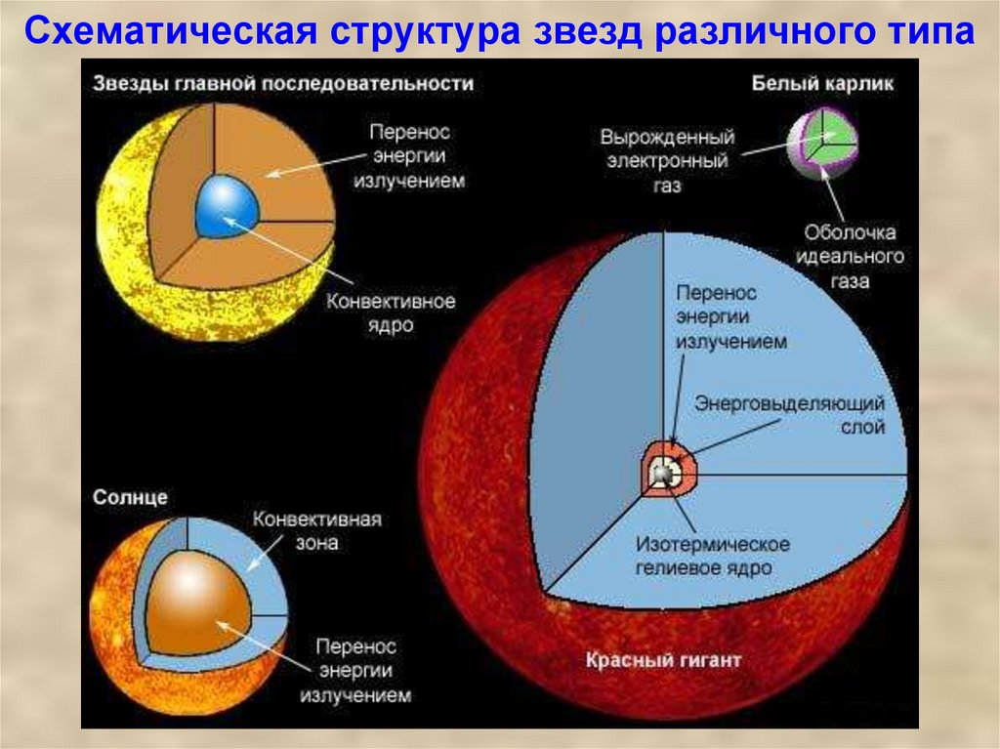| 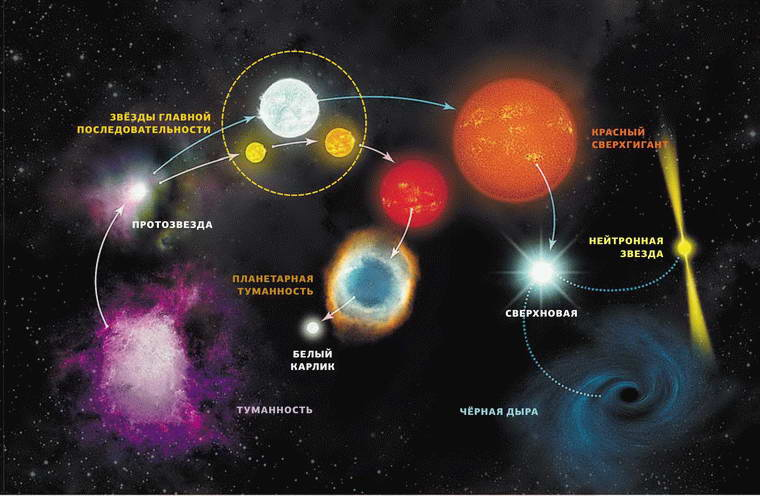

In [42]:


n_in_neurons = X_train.shape[1]
n_hidden_neurons_1 = 15
n_hidden_neurons_2 = 10
n_out_neurons = 1

num_epochs = 100001
optimizers = [torch.optim.Adam, torch.optim.SGD, torch.optim.Adamax]  # Список оптимизаторов 
rmse_optimizers = []

for optimizer_class in optimizers:
    early_stopping = CustomEarlyStopping(patience=5, min_delta=20)
    net = Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons)
    optimizer = optimizer_class(net.parameters(), lr=0.001)  

    for epoch in range(num_epochs):
        net.train()
        for batch in train_dataloader:
            data_train, temperature_train = batch
            optimizer.zero_grad()

            preds = net.forward(data_train).flatten()

            loss_value = torch.sqrt(loss(preds, temperature_train))
            loss_value.backward()
            optimizer.step()

        if epoch % 200 == 0:
            predicted_temp = [] 
            with torch.no_grad():
                net.eval()
                for batch in test_dataloader:
                    data_test, temperature_test = batch

                    test_preds = net.forward(data_test).flatten()
                    predicted_temp.append(test_preds)
                    RMSE_loss = torch.sqrt(loss(test_preds, temperature_test))

            predicted_temp = torch.cat(predicted_temp).detach().numpy()
            RMSE = mean_squared_error(y_test, predicted_temp, squared=False)

            early_stopping(RMSE)
            if early_stopping.counter == 0:
                best_rmse = RMSE
                best_predicted_temp = predicted_temp
            print(f"epoch:{epoch}, RMSE test: {RMSE}")

            if early_stopping.early_stop:
                print('Early Stoppning!!!')
                print(f"{Style.BRIGHT}{Fore.BLUE} Best RMSE test: {Style.RESET_ALL} {best_rmse}")
                optimizer_name = optimizer.__class__.__name__
                learning_rate = optimizer.param_groups[0]['lr']

                print(f"Optimizer: {optimizer_name}")
                print(f"Learning Rate: {learning_rate}")
                print('*'*40)
                rmse_optimizers.append(round(best_rmse, 2))
                break  

epoch:0, RMSE test: 15774.4189453125
epoch:200, RMSE test: 13190.4462890625
epoch:400, RMSE test: 8040.65087890625
epoch:600, RMSE test: 7002.63427734375
epoch:800, RMSE test: 6459.59912109375
epoch:1000, RMSE test: 6092.13623046875
epoch:1200, RMSE test: 5863.74853515625
epoch:1400, RMSE test: 5722.265625
epoch:1600, RMSE test: 5623.45166015625
epoch:1800, RMSE test: 5535.9775390625
epoch:2000, RMSE test: 5476.9560546875
epoch:2200, RMSE test: 5426.8369140625
epoch:2400, RMSE test: 5387.3916015625
epoch:2600, RMSE test: 5347.26025390625
INFO: Early stopping counter 1 of 5
epoch:2800, RMSE test: 5340.05859375
INFO: Early stopping counter 2 of 5
epoch:3000, RMSE test: 5336.4501953125
epoch:3200, RMSE test: 5321.5048828125
INFO: Early stopping counter 1 of 5
epoch:3400, RMSE test: 5318.4423828125
INFO: Early stopping counter 2 of 5
epoch:3600, RMSE test: 5316.8642578125
INFO: Early stopping counter 3 of 5
epoch:3800, RMSE test: 5306.53662109375
INFO: Early stopping counter 4 of 5
epoch:4

In [43]:
optimizers_rmse = pd.DataFrame(data = rmse_optimizers, index = ['Adam, lr: 0.001',
                                                                'SGD, lr: 0.01',
                                                                'Adamax, lr: 0.01'], columns = ['RMSE'])
display(optimizers_rmse.sort_values(by='RMSE'))



,RMSE
"SGD<div class=""alert alert-info""> <b>Замечания исправил.</div>, lr: 0.01",4356.200195
"Adam, lr: 0.001",5275.649902
"Adamax, lr: 0.01",5330.379883


In [44]:
# Добавим регуляризацию на лучшем оптимизаторе

class Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons):
            super(Net, self).__init__()
            
            self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
            self.bn1 = nn.BatchNorm1d(n_hidden_neurons_1)
            self.act1 = nn.ReLU()
            self.dp2 = nn.Dropout(p=0.5)
            self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
            self.act2 = nn.ReLU()
            self.fc3 = nn.Linear(n_hidden_neurons_2, n_out_neurons)
            
    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = self.act1(x)
        x = self.dp2(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.fc3(x)
        
        return x

In [45]:
n_in_neurons = X_train.shape[1]
n_hidden_neurons_1 = 15
n_hidden_neurons_2 = 10
n_out_neurons = 1

net = Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_out_neurons)
optimizer = torch.optim.SGD(net.parameters(), lr=1e-2)
loss = nn.MSELoss()

In [46]:
dataset_train = torch.utils.data.TensorDataset(X_train, y_train)
dataset_test = torch.utils.data.TensorDataset(X_test, y_test)

train_dataloader = DataLoader(dataset_train, batch_size=40, shuffle=True,
                              num_workers=0)
test_dataloader = DataLoader(dataset_test, batch_size=40, num_workers=0) 

In [ ]:
# Обучим нейросеть
early_stopping = CustomEarlyStopping(patience=5, min_delta=20)

num_epochs = 100001
val_loss = []
train_loss = []

for epoch in range(num_epochs):
    net.train()
    train_loss_batches = []
    for batch in train_dataloader:
        data_train, temperature_train = batch # просто выгружаем данные 
        optimizer.zero_grad()

        preds = net.forward(data_train).flatten()

        loss_value = torch.sqrt(loss(preds, temperature_train))
        
        loss_value.backward()
        optimizer.step()
        
        loss_value = loss_value.detach().numpy().reshape([-1])
        train_loss_batches.append(loss_value)
    
        
    if epoch % 200 == 0:
        predicted_temp = [] 
        with torch.no_grad():
            net.eval()
            for batch in test_dataloader:
                data_test, temperature_test = batch # просто выгружаем данные

                test_preds = net.forward(data_test).flatten()
                predicted_temp.append(test_preds)
                RMSE_loss = torch.sqrt(loss(test_preds, temperature_test))

        predicted_temp = torch.cat(predicted_temp).detach().numpy()
        RMSE = mean_squared_error(y_test, predicted_temp, squared=False)
        
        
        early_stopping(RMSE)
        if early_stopping.counter == 0:
            best_rmse = RMSE
            best_predicted_temp = predicted_temp
            val_loss.append(best_rmse)
            train_loss.append(np.mean(train_loss_batches))
        print(f"epoch:{epoch}, RMSE test: {RMSE}")
        
        
        if early_stopping.early_stop:
            print('Early Stoppning!!!')
            print(f'Best RMSE test {best_rmse}')
            break 

epoch:0, RMSE test: 15774.5263671875
epoch:200, RMSE test: 5825.650390625
INFO: Early stopping counter 1 of 5
epoch:400, RMSE test: 9760.5537109375
INFO: Early stopping counter 2 of 5
epoch:600, RMSE test: 9805.0732421875
INFO: Early stopping counter 3 of 5
epoch:800, RMSE test: 7498.40283203125
INFO: Early stopping counter 4 of 5
epoch:1000, RMSE test: 8885.7373046875


In [ ]:
x = np.arange(len(val_loss))

fig, ax = plt.subplots()
fig.set_figwidth(10)
fig.set_figheight(7)
ax.set_xticks(x)
val = ax.plot(x, val_loss, label = 'Validation loss')
train = ax.plot(x, train_loss, label = 'Train loss')
ax.legend()
ax.set_title('Потери нейросети', fontsize=20)
ax.set_xlabel('Эпохи (600)')
ax.set_ylabel('Loss')
plt.show()

In [ ]:
fact_forecast(predicted_temp, y_test)

## Выводы

Был проведен перебор оптимизаторов, чтобы выявить лучший из 5 представленных, с учётом шага. На данном шаге не учитывалась скорость алгоритмов, судить можно только по конечной RMSE. Судя по метрикам, лучшим оптимизатором для этой задачи является  SGD, lr: 0.01	RMSE = 4356.200195. На нём мы провели конечное улучшение модели: добавили dropout равный 50% и регуляризацию весов BatchNorm1d на первый скрытый слой. Время обучения сильно увеличилась, однако это способстовало улучшению метрики на 100 градусов. Конечная метрика RMSE в улучшинной НС равна 4356. Если посмотреть на график потерь нашей последней нейросети, то можно увидеть, что модель обучилась качественно, без недо/переобучений, благодаря ранней остановке. График фкт-прогноз схож с графиком от baseline, однако мы можем чётко увидеть, что начал предсказывать лучше до 15000 и свыше 30000 градусов по Кельвину.